In [1]:
# Setup for Colab

# !python -m pip install pyyaml==5.1
# !pip install wandb
# import sys, os, distutils.core
# # Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# # See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
# #!git clone 'https://github.com/facebookresearch/detectron2'
# #dist = distutils.core.run_setup("./detectron2/setup.py")
# #!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
# #sys.path.insert(0, os.path.abspath('./detectron2'))

# # Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

In [2]:
import torch, detectron2
# !nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

/home/cituser/anaconda3/envs/sp973/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


torch:  1.13 ; cuda:  cu116
detectron2: 0.6


In [3]:
from detectron2.utils.logger import setup_logger
setup_logger()

import numpy as np
import os
from detectron2 import model_zoo
from detectron2.data import MetadataCatalog, DatasetCatalog, DatasetMapper, build_detection_train_loader, build_detection_test_loader
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.engine.hooks import HookBase
from detectron2.utils.logger import log_every_n_seconds
from detectron2.checkpoint import DetectionCheckpointer, Checkpointer
import detectron2.utils.comm as comm
from detectron2.utils.visualizer import Visualizer
from detectron2.evaluation.fast_eval_api import COCOeval_opt
import glob
import cv2
from matplotlib import pyplot as plt
import torch
import time
import datetime
import logging
import pycocotools
import json

In [4]:
# from google.colab import drive
# drive.mount('/content/drive')

In [5]:
project_path = "../"
register_coco_instances("train", {}, os.path.join(project_path, "data/annotations/train_cats_3411.json"), os.path.join(project_path, "data/train"))
register_coco_instances("val", {}, os.path.join(project_path, "data/annotations/val_cats_3411.json"), os.path.join(project_path, "data/val"))
register_coco_instances("test", {}, os.path.join(project_path, "data/annotations/test_cats_3411.json"), os.path.join(project_path, "data/test"))

In [6]:
cfg = get_cfg()
# Use pretrained model parameters of mask_rcnn_R_50_FPN_3x.yaml
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ("val",)
cfg.DATALOADER.NUM_WORKERS = 2 # Dataloader workers
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml") # Model weights
cfg.SOLVER.IMS_PER_BATCH = 5 # Images per batch
cfg.SOLVER.BASE_LR = 0.001 # Base learning rate
cfg.SOLVER.MAX_ITER = 10000 # Max iteration
cfg.SOLVER.STEPS = (2000,3000,4000,5000,) # Steps on decaying lr
cfg.SOLVER.NUM_DECAYS = 4 # Total lr decay
cfg.SOLVER.GAMMA = 0.2 # Decay to gamma times previous lr
cfg.SOLVER.CHECKPOINT_PERIOD = 1000 # Save checkpoint every 1000 iterations
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 14
cfg.MODEL.MASK_ON = True # Mask
cfg.OUTPUT_DIR = os.path.join(project_path, "notebooks/output/")
cfg.TEST.EVAL_PERIOD = 500
cfg.MODEL.DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

[02/22 16:57:17 d2.data.datasets.coco]: Loaded 1639 images in COCO format from ../data/annotations/train_cats_3411.json
[02/22 16:57:17 d2.data.datasets.coco]: Loaded 492 images in COCO format from ../data/annotations/val_cats_3411.json


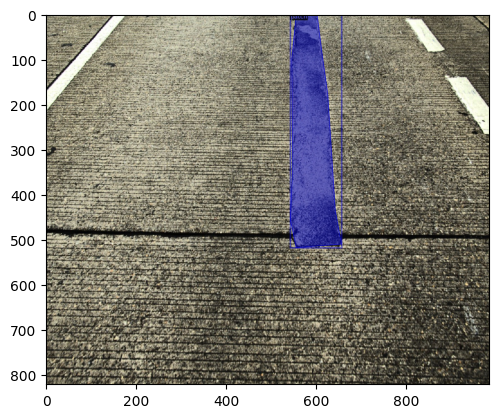

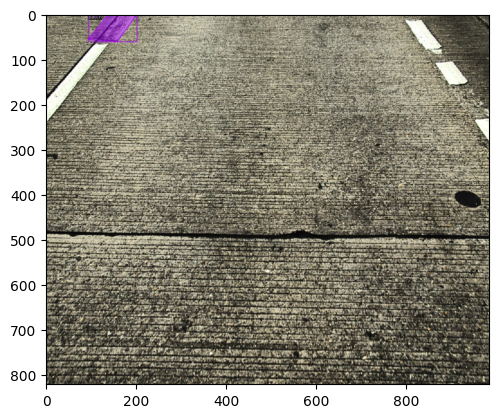

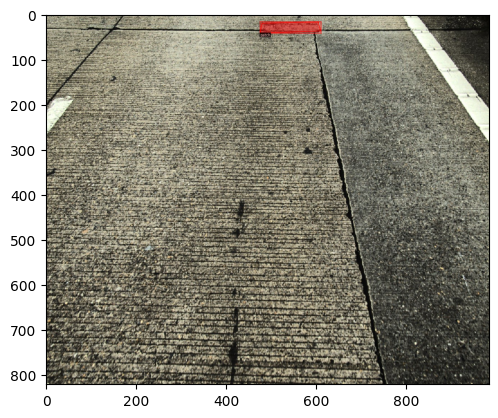

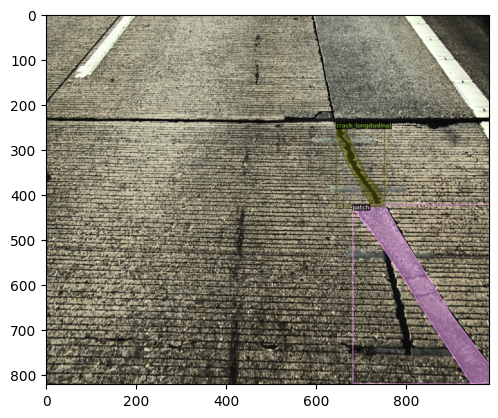

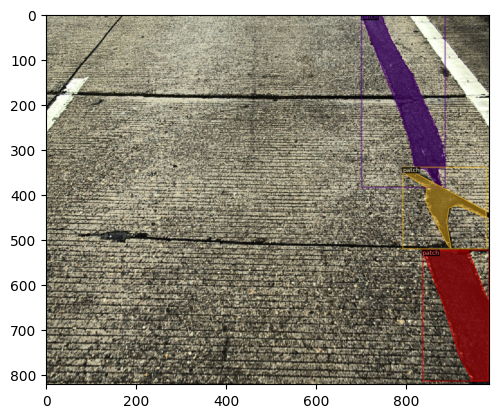

In [7]:
train_ds = DatasetCatalog.get("train")
val_ds = DatasetCatalog.get("val")
metadata = MetadataCatalog.get("train")
for d in val_ds[480:485]:
    im = cv2.imread(d["file_name"])
    v = Visualizer(im[:, :, ::-1], metadata=metadata, scale=0.8)
    out = v.draw_dataset_dict(d)
    plt.imshow(cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [8]:
coco_file_path = os.path.join(project_path, "data/annotations/pred_0220.json")
coco_json_file = open(coco_file_path)
coco_json = json.load(coco_json_file)


In [11]:
print(len(coco_json))

uncertainty_order = sorted(coco_json['annotations'], key=lambda d:d['score'])
for anno in uncertainty_order[:20]:
    print(anno['score'])

5
0.3024032711982727
0.30334630608558655
0.3043171465396881
0.3140738308429718
0.3141769766807556
0.3165881335735321
0.32046768069267273
0.3306216597557068
0.3326926827430725
0.33275556564331055
0.33458420634269714
0.3389897644519806
0.3424316346645355
0.34479019045829773
0.3585144877433777
0.35985153913497925
0.3621298670768738
0.3657624125480652
0.37004658579826355
0.37726694345474243


In [12]:
img_ids = list()
for anno in uncertainty_order:
    img_ids.append(anno['image_id'])
print(img_ids)

[1436, 2256, 1569, 1650, 2325, 2205, 1593, 2341, 1839, 1288, 2325, 1646, 2341, 2205, 3, 1440, 2075, 2178, 1706, 2098, 240, 1593, 1593, 1317, 1436, 2282, 1594, 1862, 1516, 1120, 1927, 13, 2178, 1756, 1138, 1593, 751, 1594, 2206, 1706, 1699, 1438, 2206, 1193, 2325, 1569, 13, 1830, 2281, 2183, 1107, 1964, 1569, 13, 566, 1637, 1593, 1569, 13, 2341, 13, 1927, 2318, 1699, 1706, 291, 2318, 2205, 229, 13, 2178, 1118, 1372, 2075, 1193, 1033, 2075, 1097, 1723, 13, 915, 2318, 1440, 3, 58, 13, 13, 1593, 810, 1764, 2171, 1830, 1593, 2196, 1877, 1964, 1569, 344, 411, 1706, 1751, 1288, 1436, 2205, 1756, 1337, 1436, 877, 1905, 1419, 400, 810, 1809, 1830, 2206, 1138, 927, 1751, 1735, 1569, 16, 58, 2196, 2281, 877, 1487, 915, 13, 194, 13, 877, 1340, 1196, 1450, 915, 194, 1382, 1793, 1172, 1317, 610, 1225, 877, 785, 1033, 1382, 877, 502, 2183, 233, 1138, 943, 877, 2206, 2209, 785, 1735, 1323, 1635, 2054, 1699, 1594, 229, 641, 16, 392, 1436, 1234, 1054, 1054, 1372, 1489, 1635, 1868, 2206, 1436, 525, 1440,

In [13]:
# Plot some detection results on test set
import random
test_ds = DatasetCatalog.get("test")
metadata = MetadataCatalog.get("train")
register_coco_instances("test_pred", {}, os.path.join(project_path, "data/annotations/pred_0220.json"), os.path.join(project_path, "data/test"))
pred_ds = DatasetCatalog.get("test_pred")


[02/22 16:58:22 d2.data.datasets.coco]: Loaded 211 images in COCO format from ../data/annotations/test_cats_3411.json
[02/22 16:58:22 d2.data.datasets.coco]: Loaded 211 images in COCO format from ../data/annotations/pred_0220.json


In [14]:
print(pred_ds[0])

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000008_000546_Lane1.jpg', 'height': 1028, 'width': 1232, 'image_id': 3, 'annotations': [{'bbox': [548.9613647460938, 0.0, 133.37847900390625, 997.3499145507812], 'category_id': 3, 'segmentation': {'size': [1028, 1232], 'counts': 'Ui]b0R2hm0Y1iNk0\\O2O2M2N2OO5A`0^Oe0nMV2nNiojc0'}, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'bbox': [542.1826171875, 0.0, 303.00299072265625, 990.0572509765625], 'category_id': 3, 'segmentation': {'size': [1028, 1232], 'counts': 'PjdV1'}, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000008_000546_Lane1.jpg', 'height': 1028, 'width': 1232, 'image_id': 3, 'annotations': [{'bbox': [548.9613647460938, 0.0, 133.37847900390625, 997.3499145507812], 'category_id': 3, 'segmentation': {'size': [1028, 1232], 'counts': 'Ui]b0R2hm0Y1iNk0\\O2O2M2N2OO5A`0^Oe0nMV2nNiojc0'}, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'bbox': [542.1826171875, 0.0, 303.00299072265625, 990.0572509765625], 'category_id': 3, 'segmentation': {'size': [1028, 1232], 'counts': 'PjdV1'}, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


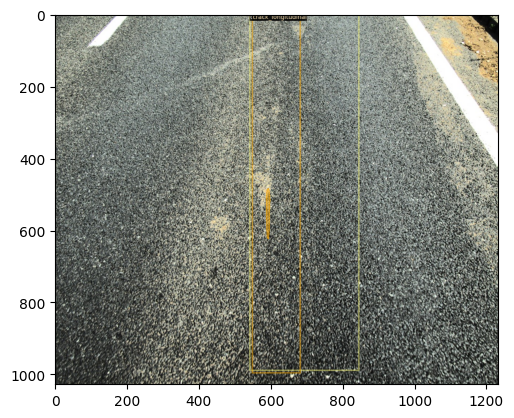

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000009_006545_Lane1.jpg', 'height': 1028, 'width': 1232, 'image_id': 1288, 'annotations': [{'bbox': [768.8628540039062, 4.375403881072998, 463.13714599609375, 478.3142395019531], 'category_id': 3, 'segmentation': {'size': [1028, 1232], 'counts': 'eReh01RP12O1N2O1O1N2O2N1O1N3N2N2N1O1O001O1O001O001O0O2O01O01O00001O01O01O001O010O001O010O10000000O01000O10O10O10O010O0010O0010O01O010O010O01000O0100O1000O01000O01000O010O01O010O01O01O010O00010O00010O0010O0100O010O100O1000O10000O100O010O1O010O10O010O01O010O010O0100000O1001O0000O0100O10O01O010O000010O01O010O001O010O0010O0100O010O100000000000O1000O01000O00100O100O100O2O1N1O2O0O100O100O010000O100000O101O0O101O0O100O1O010O10000O101O1O00001O0001O000O01000O10O10O1000000001O000000000000O1000O100000001N101O1O0001O0000000O10000O10000O101O01O0001O0000000O10000000O10001O001O10O0000001O00000O100O10000O10001O0010O0000000000000O101O001O100O1O100O100O001O001O000000010O010O01000O101N1O001N1

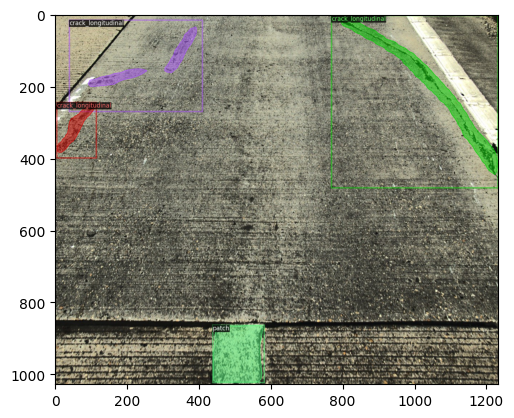

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000009_006693_Lane1.jpg', 'height': 2056, 'width': 2464, 'image_id': 1436, 'annotations': [{'bbox': [206.27830505371094, 23.15253257751465, 2171.252685546875, 123.42144012451172], 'category_id': 2, 'segmentation': {'size': [2056, 2464], 'counts': 'c^Pc02UP23moM0io19N3H7N2O2M1O2N2M2N3O0O2O001N10001N1000001N10000O1000000O101O000O1000000O10000O1000000O2O00000O100000000O100000000O100000000O100000000000001O000O100000000000000000000O100000000000000000000000000000000000000000O10000000000000000000000000000O1000000000000000000000000000001O000O100000000000000000000000000000000000000O100000000000000000000000000000000000000000000O101O00000000000000000000000000000000000O100000000000000000000000001O0000000000000000000O10000000000000000000001O000000000000000000000000000000000O10000000000000000000000000000000000000000000000000000000O10O10000000000000000000000000000000000000000000000000000O1000000000000000000000000000000000000000000

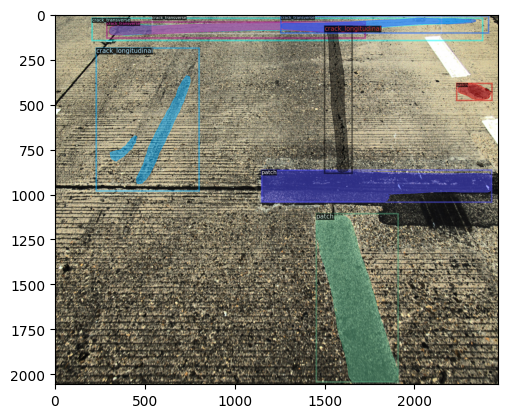

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000009_006697_Lane1.jpg', 'height': 2056, 'width': 2464, 'image_id': 1440, 'annotations': [{'bbox': [1559.3231201171875, 233.5344696044922, 896.8800048828125, 1340.9078369140625], 'category_id': 3, 'segmentation': {'size': [2056, 2464], 'counts': 'ihbT33TP26J5K6J5K5L5J7J6J7H2O2M3N1N3N2M2O2N1N3N2N1N3N1O2M2O1O2M2O2N1N2O2N1N2O2N1O1O2O0O1O2N2N101N1O1O2O0O2N1O101N1O100O2N1O100O1O101N1O100O1O1000001O0010O010000000000O10O10O0100O01O01O00001O00000000001O000O100000001O0O20O01O1O00010O01O00100O1O1O001N101O001O0O1000000O100O1000000000000010O0010O010O100001O00001O00000O10O010O0001O01O000000O100000000O100000001O010O001O100O00100O0100O100O001O1O001O000O101O0O10000O2O000O2O001O0O2O001O1O1O1N2O1O1O1O1O1O001O001O00000001O00001O1O010O001O001O010O0001O010O001O1O00100O1O1O001O1O001N100001O01O01O010O00100O10O10O10O10O01O100O1O2O0O1O1O001O1O00001O0000000001O010O00100O1O10000O100000O10000O1O101N1O1O1O010O001N101O00001O00001O10O01O100O2O00

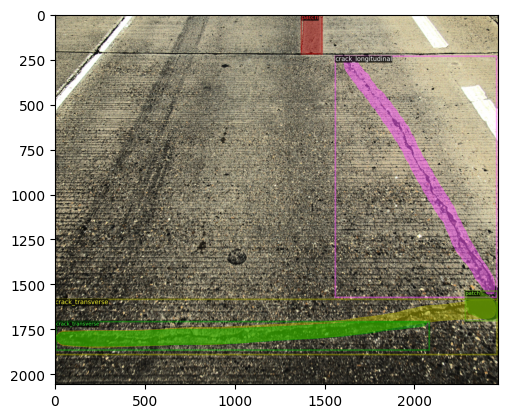

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000009_006826_Lane1.jpg', 'height': 1028, 'width': 1232, 'image_id': 1569, 'annotations': [{'bbox': [794.7990112304688, 143.66859436035156, 430.25335693359375, 865.8700561523438], 'category_id': 10, 'segmentation': {'size': [1028, 1232], 'counts': 'eXQi0T1mn06K4M3L4N1O2M2O1N3N2N2M3N2N2N3L3N2N2N1O2N1O1O1O1O1O1O1O1O1O1O2N1O1O1O1O2N2N2O1N2N1O2N100O2N1O010O1O10000001O001O101O0O11N100O10O01O000000O10001O001O1O1O1N2O1O1O000010O1O1O2O0O1O10O01O01O001O001O1N3N1O1O00100O0100O1O1O1O1O1O01O001N2O2N1O2M2O1O0O101O0O100O0101N101N2O1O1N4M2N2N1O1O1O1O00010000O1001N2N4WUOYLmh0j3jVO\\LUi0g3cVO^L]i0e3ZVObLei0`3TVOeLki0_3mUOfLSj0\\3fUOiLZj0X3`UOnL_j0[401O10O01000O010O10O010000O100O1O101N2N1O2N1O1O101N1O001O1O10O01001O00001O1O001O001O01O001O0O2O1N2O0O2N100O2O0O1O100O1O100O1000001O1O1O100O100001N1O010O0O2O000000000000000001O001O001O100O02O0O2N2N2N2N2N1O2N1N3N1N2O2N1N2O1N2O2N2M3N2N2N3M2N2N1O1O10O1000O100O1O2O2M2N3M2M2O1O1O0O2O0O2O1O1O2M3N

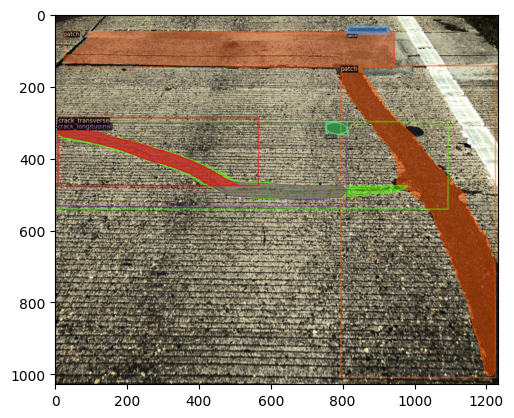

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000009_006850_Lane1.jpg', 'height': 1028, 'width': 1232, 'image_id': 1593, 'annotations': [{'bbox': [825.939697265625, 65.88189697265625, 384.5653076171875, 962.1181030273438], 'category_id': 10, 'segmentation': {'size': [1028, 1232], 'counts': 'd\\ni0a1om0X1VOe0\\O;F7I7J6J5K6I8I7J7I8H6J6K4K5L3M3L4N2N2M4M3M4K5L3M3L3N2N2M3N2N1N3N2M3N3L4L4M3L3N2M3M3N1N3M2O2M3M3N2M4M4K5L3L4M2M3N2M2O2N1O2O1N3M3M3M4L5K3M4L2N2N2N3N1N3M3N4K9H7H8H8I4K4MoE^]Oa6_b0ZI]^OR6ba0hIf^OV6Za0cIo^O\\6Ra0[IW_Od6i`0TIb_Oj6_`0jHn_OT7R`0\\Hb@b7^?lGTAT8m>ZGbAh8nb01O2M2N1N1O1O0100O2O0100O2N2N2N00000O01O00000001N2O2M4L3M2N2N2N1O2N1O1O101O2N2O1O01O0O010O00O100O1O2N3M4L5L3L5L4L3M2N100O0000001O1O1O3M4K8I5K5J5L3L3N2N1O2O2O1N3M5J8H7J5I4M2N2N1N2O0010001O101M3N1N2N2N2N1N2O3M4L5K5L5L2N0O00000O1O001O0O01O101N2O1N3M101N1O1O1O1N101O1N2O2M4L4M2M3N2M2N2O1N101N1O2N2N3M3M4L4M3L3M2N2N2N2N1O2N3M2N4L4L5K4L4L4L3M2N3M2N3M2N4L3M4L3M4L4L4L5K4L3M3M2N2N2N3M3M3M3M5K4L5K3M3M2N2M3N1O2

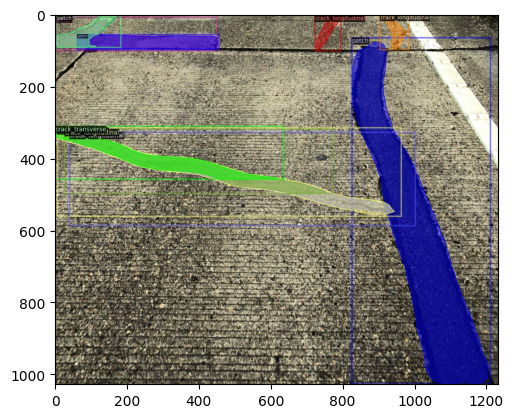

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000009_006903_Lane1.jpg', 'height': 1028, 'width': 1232, 'image_id': 1646, 'annotations': [{'bbox': [129.27305603027344, 40.71076965332031, 283.069091796875, 555.073486328125], 'category_id': 3, 'segmentation': {'size': [1028, 1232], 'counts': 'aYS76ko08H8I7I5K4L5K4L4N2M1N2O1O1O1O1O1O1O1O1N2O0O2O0O2N2O0O2O1O0O2N1O1N2N3N1N2O2N1O1O1O001N101N2O010O1O010O00000000O100000001O0O1O1O001O0010O0100O100O010O001O100O11O0O1O100O0O2O00O11O010000O1O1O01O01O10001O0O2N1O010O00100O10001N1O1O1O0000001000000000O1O0O2O00010000O100O001O1O1O10O0100000001O0O2N1N3M3M3N2O001O1N1O10O01001N10100N100O00000000010O1002O0O2N2N101N101O0O3N5I<D\\Tii0'}, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


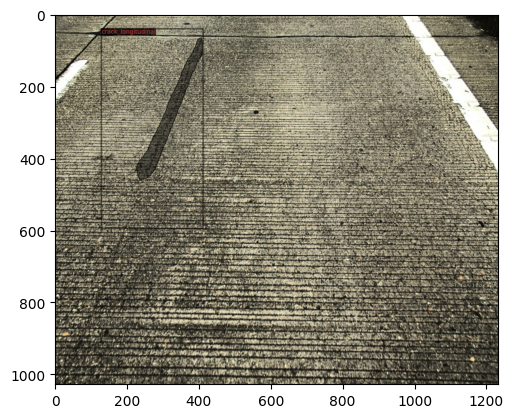

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000009_006907_Lane1.jpg', 'height': 1028, 'width': 1232, 'image_id': 1650, 'annotations': [{'bbox': [546.1968383789062, 28.950498580932617, 133.6591796875, 990.882080078125], 'category_id': 3, 'segmentation': {'size': [1028, 1232], 'counts': '_P\\b0S1fn0f0]O9F:G9G8H9A=F:F:C>\\Oc0D<E;F:H7E;C:K6L4O21N3M4L4L3N4K5J6K5K5K5L3L5L4I7I9C=D=C=D<D=D<C>ZOf0YOkikb0'}, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


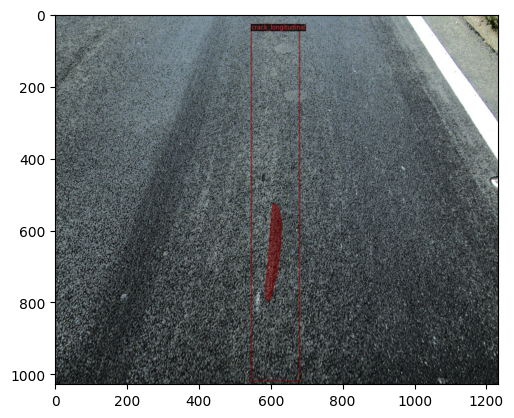

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000009_006963_Lane1.jpg', 'height': 1028, 'width': 1232, 'image_id': 1706, 'annotations': [{'bbox': [110.20176696777344, 19.065410614013672, 56.656768798828125, 24.983421325683594], 'category_id': 10, 'segmentation': {'size': [1028, 1232], 'counts': 'Y_`31QP12O1O2O0O1N2O1O1O1O1O1N2O1O1O1O1O1O10000O100000000000000000000000000000O1000000O10000O10000O1N3N1M3O1N2N3LeT^Q1'}, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'bbox': [876.8890380859375, 271.56689453125, 117.645751953125, 601.0407104492188], 'category_id': 3, 'segmentation': {'size': [1028, 1232], 'counts': 'PkXl0W1dn0>H7J6J6K5K4nUOoMje0U2lYO_Nge0d1oYO[OYe0h0`ZO0ld03nZO5md0NkZO=od0GkZO?Qe0EhZOa0Ue0CdZOd0Ye0^O`ZOi0]e0[OZZOn0ce0E\\YOm0`f0b4K4K4M101O2M100OQKbZOYO[e0:][O_O`d07T\\OBhc0?]\\O]Obc0b0d\\OYO\\c0e0f\\O[OYc0c0j\\O]OVc0?Q]O_Omb0=\\]O@cb0<f]O@Yb0=o]O_OPb0>V^O^Ola0>Y^O@ia0;[^OCga09\\^OGda06`^OI`a03e^OM[a0Oi^O1Xa0Jl^O5Ua0Fo^O;Qa0@S_O`0n`0\\OT_Oe0m`0VOV_Ol0k`0nNX_OS1j`

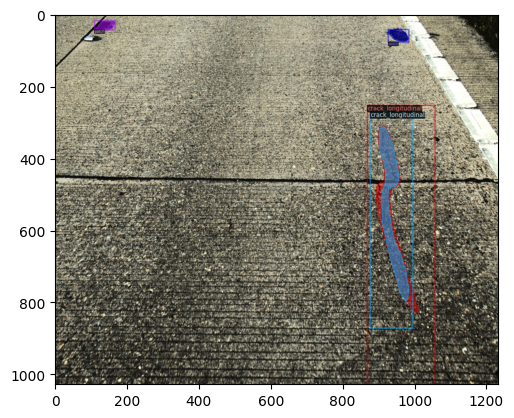

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000009_007096_Lane1.jpg', 'height': 1028, 'width': 1232, 'image_id': 1839, 'annotations': [{'bbox': [1056.3253173828125, 365.79095458984375, 83.25244140625, 72.5098876953125], 'category_id': 10, 'segmentation': {'size': [1028, 1232], 'counts': 'j_UQ12oo07K4M2M3N3M2M3N2N1O2N2N2N2N2N1O2N3M2N2N3M3M2N3M1O1O1O1O001O001O0000001O0000001O0000000000001O0001O00001O1O001O2N1O3M1N4M4L2N2N2N2N2N2N1O1O2N1O1N3N2M3M3M3L4M6Gknn2'}, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


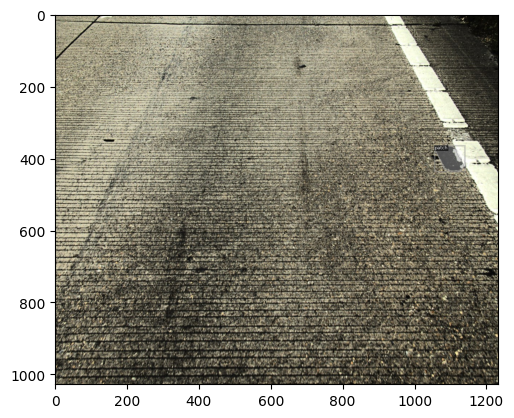

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000009_007332_Lane1.jpg', 'height': 1028, 'width': 1232, 'image_id': 2075, 'annotations': [{'bbox': [842.4114990234375, 0.0, 383.241455078125, 903.6229858398438], 'category_id': 3, 'segmentation': {'size': [1028, 1232], 'counts': 'S\\hj04ko0`0@c0^Og0XOj0WO;E;E=F8I3M2006K7I8HQ1PO1O1OO1OO0000O0102L4K5L4K5L3M3L4M3L4M2M4L<E8G6K3L4L3N\\Tk01ckTO1N2O2M4M4L6I=D4L3L3N3M4K4M4L5J7J8H8G9H8H8H8H6J8H7I8H8H:F7I6J5K5K4L5K3N2M3N1N3N2M3N3M3M3L4M3M1O2N1O1000O10010O0101N2O1O0008H>BU1jN9G:G7H3N2N2N2N2M3N1N1O001O0O101O100O101N3M2N1O1O1O1N1O2O1N3N1O1O1O10000O000000001N101N101O0O100000O101N100O100O10O2O0O2O000O0100O010O1O1O1O1O2O0O100O100000O2O0O100O010O000100O1O1O100O1O001O0010O00100O100O10000000O1O100O010O10O100O1O2O1N1O2O0O1O1O010000000001O0001O001N100O10O010000000O2O1O1O001O0000O101N101O0O100000001OO2O0000O100O100O100O010O01O001O1O001O100O1O10O10000O1O2N100O1O0O101O00001N10001O00001O01O01O1O2N1O2N100O1O1O10O01O1O000N3N1O2N1N4M3M4L3L4M3

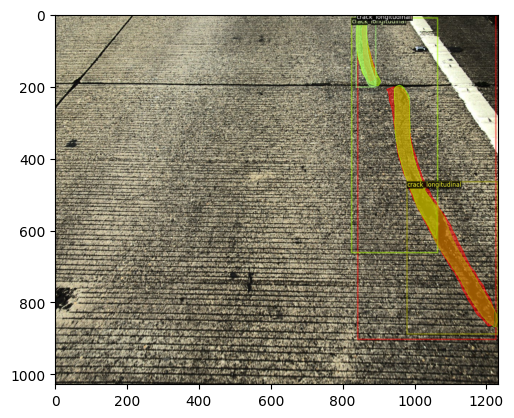

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000009_007355_Lane1.jpg', 'height': 1028, 'width': 1232, 'image_id': 2098, 'annotations': [{'bbox': [879.8734741210938, 181.19688415527344, 351.88177490234375, 723.8959350585938], 'category_id': 10, 'segmentation': {'size': [1028, 1232], 'counts': 'ifSl04jo09H8K4K6K6J5L6I6L3L3M3N2M3N1N3N1O2N2N3M3M2M3N2N1O1O2N1O1O1O1O1O2N2O1N3M3M2N2N1O2N10O01O1O1O1O2O0O1O1O1O2N2O1N2N3M2N2N2O1N2N2N2N1O2O1O1N2O1N2O1N2O0O2O0O100O2O001O2N2N1O2N1O1O0010O002N101O1O1O10000O1O2M2O0O001O01O010O2O1N2O0O2OO010O0010000000O2N3M2N1O1O1O1N10001O100O2O1O10O1O000O0001O001O1O1O2M3N2N1O1O1O0010O011N11O001O2M2N1O1O1O1O001O100O2O1O2O000O000O100O1N2O1N4M2N1N3N2N1O1N2O2N002O0001O001N0100O001O001O1O100O101OO2O1O0O1O10O01O0001O10002N0100O1O0O100O0001O100O2O1N200O01O0O100O0010O101O1O001O01O1N100O0010O1O101N2O1N100O1000O001O2O000001O100O1O00000O0101N100001O2O0O1O1O0000O100O100001O1O1O00001O00O10000O11O001N101O0O100O1O010O01O1O2N2O1N2O1N2N2N2N1O1O2K6I7I8E<@f1dM

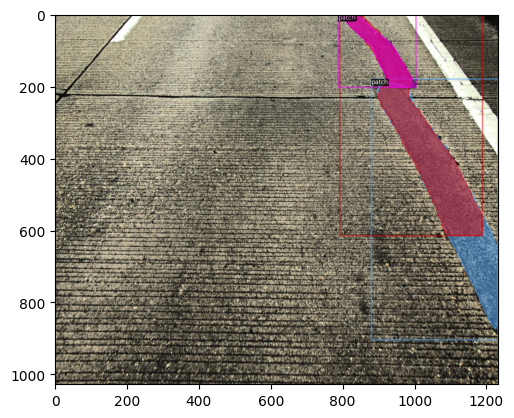

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000009_007435_Lane1.jpg', 'height': 1028, 'width': 1232, 'image_id': 2178, 'annotations': [{'bbox': [735.6221313476562, 0.0, 165.6038818359375, 583.0477905273438], 'category_id': 3, 'segmentation': {'size': [1028, 1232], 'counts': '_Ybg0f0Vo0c0B;F:F9G;D?Aa0_Oc0]O`0@;F8I5J6J6J6J6I6K6I7J5J6L3L4K5L3K6K5K5L4K3N3L4L4L3M3N1N2O1OUKgYONXf0DgZOKYe01a[OYO^d0e0Z\\O`Nlc0\\1o\\OcMZc0[2W501N2O1N0O20O02O1O001N2O1O10O1N1O2N101O001O1O0100O1O1O00O1O2O10000000O1O00010N100O1N3O0000O11N1N3O2N0000O00O2001O1N2N1N3N2O1N1N2J6L5F:F9K5M2N31O1O2O2N1N3M2N3N2M3M4L3M3K5L5L4L3M4L4L3M5J7J6I8H8H9Bl0QOSYc:'}, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'bbox': [308.5697021484375, 236.37403869628906, 112.61260986328125, 77.03120422363281], 'category_id': 10, 'segmentation': {'size': [1028, 1232], 'counts': 'c`j97jo03O1M3N3N1N2M3M3N2N2M3N2N2O1M3M3M3O1L4N2M3O1L4L4O1O1O1O1O100O2O000000000O100000000000000000000000000000000001O00000000000000000000000000000000000

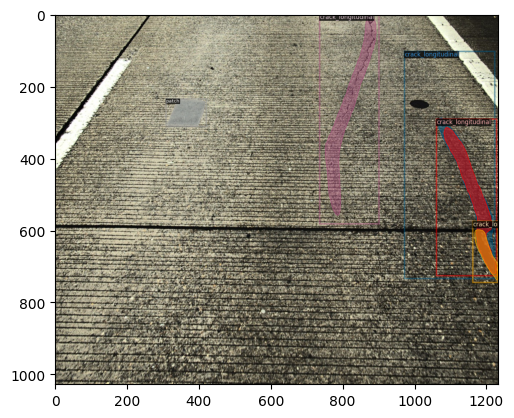

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000009_007462_Lane1.jpg', 'height': 1028, 'width': 1232, 'image_id': 2205, 'annotations': [{'bbox': [2.6153697967529297, 495.3764343261719, 211.3590545654297, 426.3719787597656], 'category_id': 3, 'segmentation': {'size': [1028, 1232], 'counts': 'Zl8?\\o0=G7H9H6J7J3M2O2N2N2M3N3N1O2N1N2O2M201N10000O100O0010O01O001O001O001O001O00010O001O1O001O0001N1O100O100O100O101O000O2O00O1O10O01O10001N1O1O1O1O2M2000000O2O01O0010O00000O1O2N101O1O00O101O00100O001O0O10O00100000O1O1O1O1O2M2O2N100O0001O10001O000000000001O01O001N1M4L3N2O2O1O001O10O01O0N3L3M4M2O1O101N11O1N101O1O001O1O1O1N2O1O001O2N1O2M2N3L4M2N3L4M3M3L3M4L4L4M3M3M3L4M3L5J5L4M3L5K5K5Kaa\\P1'}, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'bbox': [18.207067489624023, 935.9854736328125, 1195.3414306640625, 72.50054931640625], 'category_id': 2, 'segmentation': {'size': [1028, 1232], 'counts': 'dPf05lo05L4M3M1O2O0O2O0O2O0O2O001N10001N100000000000000000000000000000000000000000000000000

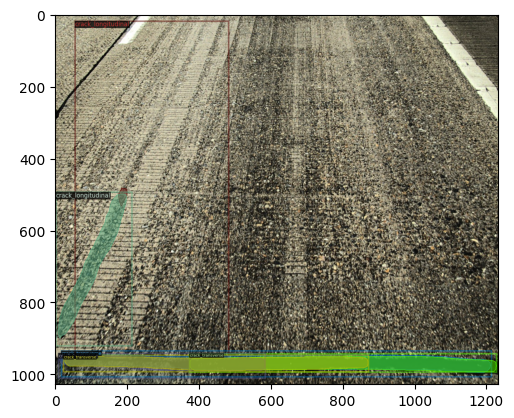

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000009_007513_Lane1.jpg', 'height': 1028, 'width': 1232, 'image_id': 2256, 'annotations': [{'bbox': [1050.7618408203125, 147.964111328125, 76.1585693359375, 45.912506103515625], 'category_id': 10, 'segmentation': {'size': [1028, 1232], 'counts': '^XQQ18ko03N2M3N2M2O2N1N2O1O1O2N1O1N2O1O1O1O1O001O001O00001O0000001O000000001O000000010O00000001O0001O01O00001O00001N101O001O1O001O1O001O3L4M3M4K5L2M5JgW[3'}, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


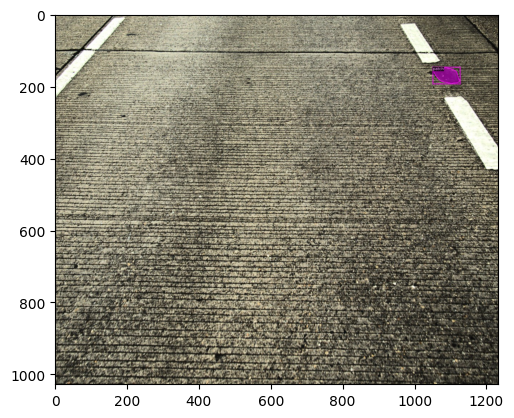

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000009_007582_Lane1.jpg', 'height': 1028, 'width': 1232, 'image_id': 2325, 'annotations': [{'bbox': [803.7469482421875, 221.71327209472656, 133.03106689453125, 806.2867431640625], 'category_id': 3, 'segmentation': {'size': [1028, 1232], 'counts': 'cQ_i0g1jk0_3]NT1ROl0]O=E8G9H7J7J5J5J7I6H9J5J6K5J6G9F:E;H8I7I6J7I6I7I8J5L3M3N2N00L3J5B`0\\Oc0I8I8F9F:aN_1UOk0H8I8H7M4L3N1N4L3O3M2N2M2N3M2N1O2L4J7I7J4NO0O10102L4M10011K6J6J6F:G8ZNf1F9J7O100001N20011N2O2M2M4L5M2M4M2M4L4K5J5K6K5L5J5I7H9G9F:E<C<D=C?D;E<D<D=B?YOo0mNQn`9'}, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'bbox': [611.968994140625, 95.13215637207031, 108.83843994140625, 143.63345336914062], 'category_id': 10, 'segmentation': {'size': [1028, 1232], 'counts': 'VdZc03oo05L2K4M3N2N3L3M3N2O1N2N2N2N2L4M3N2N2M3M3N2M3L4M3N2N2N2N2N2M3L4N2O1N2N2O1N2N2N2N2N2N2O1O1N2N2N2N2O1N2M3O1O1N2N2N2N2O1O1O001O100O10O010O100O1O0O2N2M3_Oa0J6K5J6K5L4M3K6K4N2N2N2M3N2N2N2N2M4L3N2L5M3L4K6J5L6HSmT`0'}, 

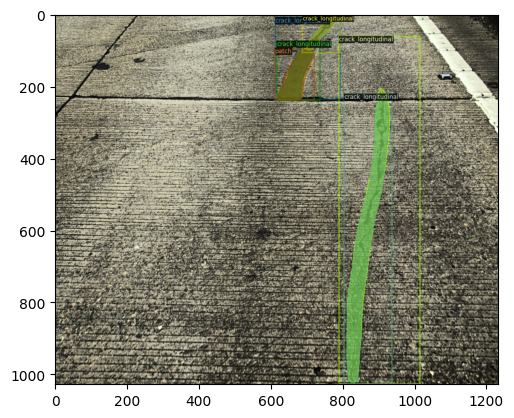

{'file_name': '../data/test/A14EBWBJ47AWoolpittoHaugleyBridge_sideview_000009_007598_Lane1.jpg', 'height': 1028, 'width': 1232, 'image_id': 2341, 'annotations': [{'bbox': [774.509033203125, 12.524044036865234, 206.7059326171875, 976.6082763671875], 'category_id': 3, 'segmentation': {'size': [1028, 1232], 'counts': ']QXj01lo0`0G1O0O2O001O0O2\\gl0NoVSOT2[Oj0VOe0[Og0YO?B=H7J3M3N3M3M3N4L4N3N4K4M1N3M2M3N2O00O100000011O3J:H[1dN8I7I5L10OO1L5L5K6J5K5L3M<D;F;B<E7I4L2N1N1N2N3N0O2O2N2O22N1M4L5K8G5K4M00N3N2N001O001N3M3L4M2O8H6K3J6FkZc8'}, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'bbox': [563.0516967773438, 0.0, 326.87939453125, 997.2395629882812], 'category_id': 3, 'segmentation': {'size': [1028, 1232], 'counts': ']j[d0>ao0=E9F9G:F:E>B>C`0Ab0jTOdLbh0T4UVOoLZi0^5]O=E:I3M3N2M3N2M2O1O1N2O1000N6I7J8QIWYOQ4Tg0oJ[ZOW4Ti0E3N3L3M3M3M2O2K6I6K6I:F;E:F:E:iNUej`0'}, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'bbox': [3.7652151584625244, 11.641145706176758, 228.8856964111328, 286.0339660644531], 'category_id': 3, 'seg

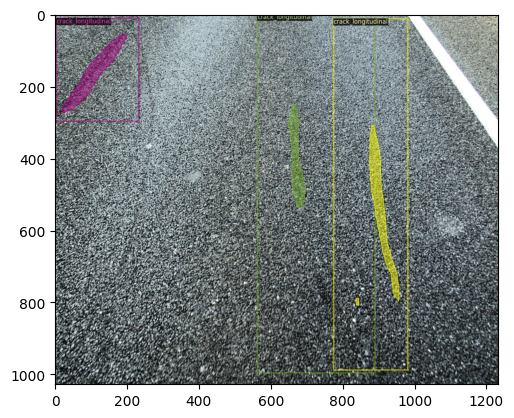

In [15]:

for d in pred_ds:
    if d['image_id'] in img_ids[:20]: 
        print(d)  
        im = cv2.imread(d["file_name"])
        v = Visualizer(im[:, :, ::-1],
            metadata=metadata,
        )
        out_pred = v.draw_dataset_dict(d)
        plt.imshow(cv2.cvtColor(out_pred.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
        plt.show()